In [1]:
import cv2
import matplotlib.pyplot as plt

# SIFT descriptor

## Overview

In 2004, D.Lowe, University of British Columbia, came up with a new algorithm, Scale Invariant Feature Transform (SIFT) in <br>
his paper, Distinctive Image Features from Scale-Invariant Keypoints, which extract keypoints and compute its descriptors.
<br><br>
There are mainly four steps involved in SIFT algorithm:
1. <strong>Feature point (also called keypoint) detection</strong>:<br>
To make sure that features are scale-independent.<br>
The first stage of computation searches over all scales and image locations. It is implemented efficiently by using a <br>
difference-of-Gaussian function to identify potential interest points that are invariant to scale and orientation.
2. <strong>Feature point localization</strong>:<br>
Identifying the suitable features or keypoints.<br>
At each candidate location, a detailed model is fit to determine location and scale. Keypoints are selected based on <br>
measures of their stability.
3. <strong>Orientation assignment</strong>:<br>
Ensure the keypoints are rotation invariant.<br>
One or more orientations are assigned to each keypoint location based on local image gradient directions. <br>
All future operations are performed on image data that has been transformed relative to the assigned orientation, scale, <br>
and location for each feature, thereby providing invariance to these transformations<br>
4. <strong>Feature descriptor generation</strong>:<br>
The local image gradients are measured at the selected scale in the region around each keypoint. These are transformed <br>
into a representation that allows for significant levels of local shape distortion and change in illumination.<br>

#### 1. Feature point detection
As its name shows, SIFT has the property of scale invariance, which makes it better than Harris. Harris is not scale-invariant, <br>
a corner may become an edge if the scale changes.<br><br>
<i>So how does SIFT achieves scale invariance?</i><br><br>
We can find the features under various image sizes. we can use the Laplacian of Gaussian(LoG) with different σ to achieve this.<br>
LoG acts as a blob detector which detects blobs in various sizes due to change in σ. In short, σ acts as a scaling parameter. <br>
For eg, gaussian kernel with low σ gives high value for small corner while gaussian kernel with high σ fits well for larger <br>
corner. So, we can find the local maxima across the scale and space which gives us a list of (x,y,σ) values which means there <br>
is a potential keypoint at (x,y) at σ scale.<br>
But this LoG is a little costly, so SIFT algorithm uses Difference of Gaussians which is an approximation of LoG.

#### 2. Feature point localization
Once the images have been created, the next step is to find the important keypoints from the image that can be used for <br>
feature matching. The idea is to find the local maxima and minima for the images. This part is divided into 2 steps:<br>
Step 1: Find the local maxima and minima<br>
Step 2: Remove low contrast keypoints (keypoint selection)<br>
<br><i>Find local maxima and local minima</i><br><br>
To locate the local maxima and minima, we go through every pixel in the image and compare it with its neighboring pixels. <br>
Neighboring pixels are not only the surrounding pixels of that image, but also the nine pixels in the scale above and below. <br>
A pixel is selected as a keypoint if it is the highest or lowest among the neighbors.<br>
<br><i>Keypoint selection</i><br><br>
We now have potential keypoints that represent the images and are scale invariant. But some of these keypoints may not be <br>
robust to noise. Therefore, we need to perform a final check to make sure that we have the most accurate keypoints to represent <br>
the image features. Hence, we will eliminate the keypoints that have low contrast, or lie very close to the edge.<br>
We used Taylor series expansion of scale space to get more accurate location of extrema, and if the intensity at this extrema <br>
is less than a threshold value (0.03 as per the paper), it is rejected. This threshold is called <strong>contrastThreshold</strong> in OpenCV.

#### 3. Orientation assignment
At this stage, we have a set of stable keypoints for the images. Now an orientation is assigned to each keypoint to achieve <br>
invariance to image rotation. We can again divide this step into 2 smaller steps:<br>
Step 1: Calculate the magnitude and orientation<br>
Step 2: Create a histogram for magnitude and orientation<br>

<br><i>Calculate the magnitude and orientation</i><br><br>
Once we have the gradients in x and y of the image, we can find the magnitude and orientation using the following formulas:<br>
- Magnitude:<br>
\begin{equation*}
|G| = \sqrt{(G_x)^2 + (G_y)^2}
\end{equation*}
- Direction:<br>
\begin{equation*}
\theta = \arctan(\frac{G_y}{G_x})
\end{equation*}

<br><i>Create a histogram for magnitude and orientation</i><br><br>
An orientation histogram with 36 bins covering 360 degrees is created (It is weighted by gradient magnitude and gaussian-weighted <br>
circular window with σ equal to 1.5 times the scale of keypoint). The highest peak in the histogram is taken and any peak above <br>
80% of it is also considered to calculate the orientation. It creates keypoints with same location and scale, but different directions. <br>
It contribute to stability of matching.<br><br><br>
<img src="sift.png">

#### 4. Feature descriptor 
So far, we have stable keypoints that are scale-invariant and rotation invariant. In this section, we will use the neighboring pixels,<br>
orientations, and magnitude, to generate a unique fingerprint for this keypoint called a 'descriptor'.<br>
We will first take a 16x16 neighborhood around the keypoint. This 16x16 block is further divided into 16 sub-blocks of 4x4 size. <br>
For each sub-block, 8 bin orientation histogram is created. So a total of 128 bin values are available. It is represented as a vector <br>
to form keypoint descriptor.


## OpenCV SIFT

To calculate the descriptor, we can use:<br><br>
<i>sift = cv.SIFT_create()</i><br>
<i>kp, des = sift.detectAndCompute(gray,None)</i><br><br>
Output: kp will be a list of keypoints and des is a numpy array of shape (Number of Keypoints)×128.

In [2]:
def apply_SIFT_descriptor(img):
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Applying SIFT detector
    sift = cv2.SIFT_create() 
    kp, des = sift.detectAndCompute(gray_img, None)
    print("Number of keypoints: ", len(kp))
    print ("Keypoint description:")
    for p in des:
        print(p)

    # Marking the keypoint on the image using circles
    img=cv2.drawKeypoints(gray_img ,
                            kp ,
                            img ,
                            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
    
    plt.figure(figsize=(20, 20))
    plt.imshow(img)

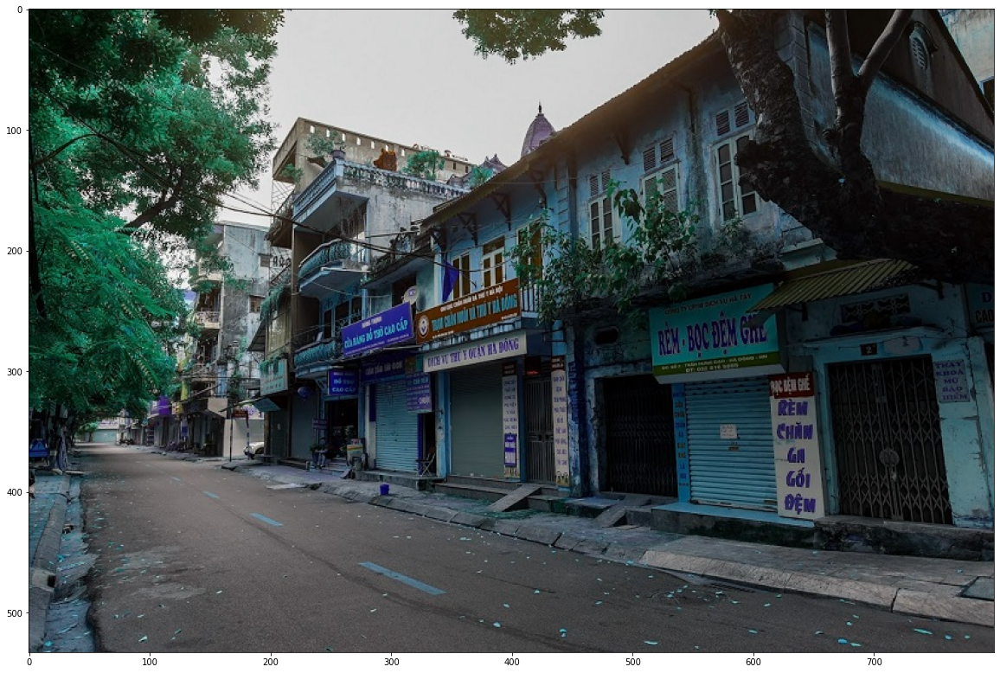

In [3]:
img = cv2.imread("../hanoi.jpg")
plt.figure(figsize=(20, 20))
plt.imshow(img)

Number of keypoints:  2587
Keypoint description:
[ 82.  30.  16.  30.   3.   4.   9.   7. 147. 123.  20.   1.   0.   0.
   1.  13.  16.  17.  20.   2.   0.   0.   0.  19.   0.   0.   0.   0.
   0.   0.   0.   0.  51.   2.   0.   0.   4. 111. 147.  37. 147.  33.
   2.   0.   1.  27.  27.  82.  65.  13.  14.  11.   1.   3.  16.  97.
   0.   0.   1.   2.   0.   0.   0.   0.  15.  10.  16.  64.  81. 147.
 109.  19. 147.  54.  18.  12.  30.  74.  37.  60.  50.  46. 134.  92.
   7.   1.   3.  12.   0.   0.  17.  12.   0.   0.   0.   0.  24.  18.
   6.  27.  49.  63.   9.   5.  15.   2.   2.  20.  44.  26.  14.  39.
   9.   6.  15.  45.  42.   4.   1.   9.   6.   6.   4.   2.   0.   0.
   1.   7.]
[125. 112.  19.   3.   1.   1.   2.  41. 142.  97.   6.   1.   0.   0.
   0.  35.  17.  10.  17.   8.   1.   1.   0.   8.   0.   2.  13.  18.
  23.   8.   1.   0.  59. 142.  45.  18.  10.   6.   0.   2. 142. 142.
  14.  17.   7.   3.   3.  25.  40.  13.  80. 142.  27.   9.   4.   8.
  23.  56. 101. 

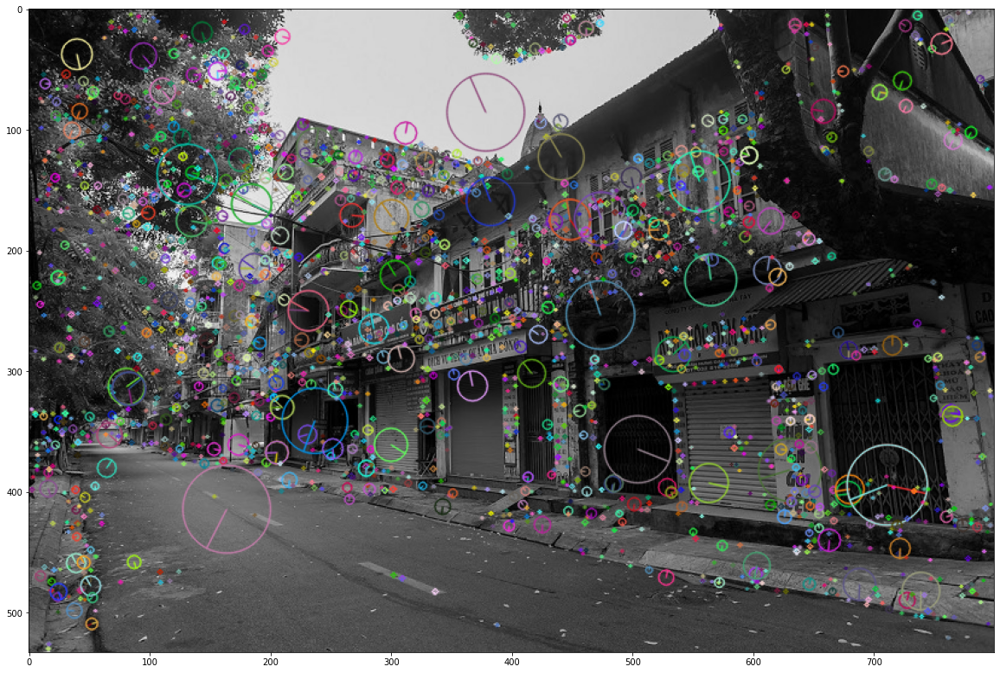

In [4]:
apply_SIFT_descriptor(img)

## SIFT descriptor with pyramid images

In [5]:
img = cv2.imread("../hanoi.jpg")
imgDownScale = cv2.pyrDown(img)
imgUpScale = cv2.pyrUp(img)

Number of keypoints:  12372
Keypoint description:
[ 52.  22.   2.   4.   6.   1.   0.   3. 148.  37.   0.   0.   0.   0.
   3.  60.  20.   2.   0.   0.   0.   0.   6.  28.   0.   0.   0.   0.
   0.   0.   0.   0. 104.   5.   0.   2.  18.   2.   0.  11. 148.  34.
   4.   1.   0.   1.  15. 148.  40.  12.  12.  21.   4.   5.  41.  78.
   0.   0.   0.   2.   0.   0.   0.   0.  68.  32.   0.   1.  21.  10.
   0.   1. 148. 148.  54.   2.   0.   0.   1.  10.  28. 141. 148.  57.
   3.   2.   2.   5.   4.   5.  10.   7.   0.   0.   0.   0.   6.  10.
   0.   0.  20.  21.   1.   0.  38. 146.  15.   0.   1.   2.   1.   1.
 136. 141.  33.   1.   0.   0.   0.   1.  37.  15.   5.   0.   0.   0.
   0.   2.]
[  5.  31.   9.   0.   0.   3.   3.   0.  77.  92.  33.   6.   6.  15.
  15.  14.  30.  32.  17.  19. 122. 123.  42.  14.  13.  19.   0.   3.
 123. 117.   0.   0.   0.   0.   0.   2.   6.   8.   3.   0.  31.  95.
  36.  44.  47.  15.   3.   1.  55. 119.  78.  41.  90.  38.   8.  18.
   2.   3.   1.

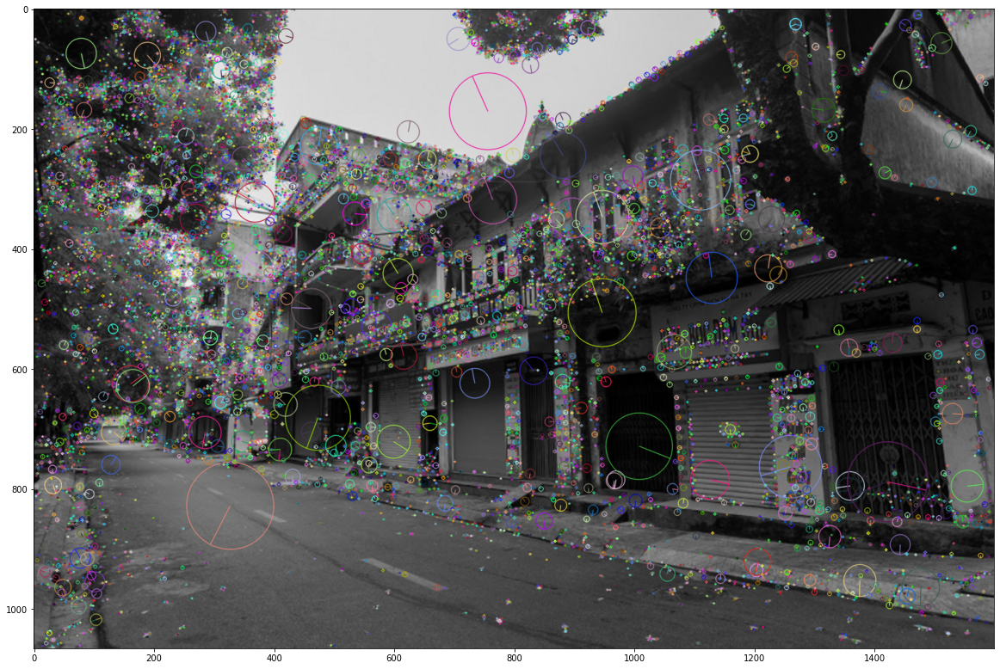

In [6]:
apply_SIFT_descriptor(imgUpScale)

Number of keypoints:  1080
Keypoint description:
[  3.   1.   2.  40.  92.  18.   2.   1.  98.  15.   1.   2.  23.  14.
   8.  34. 119.  13.   0.   0.   0.   0.   0.  62.   1.   0.   0.   0.
   0.   0.   0.   1.   2.   6.  18.  61.  86.   9.   4.   6. 102.  52.
  16.   5.   3.   3.  26.  73. 141.  51.   0.   0.   0.   0.   8.  82.
  29.   2.   0.   0.   0.   0.   0.   6.  12.   1.   2.   7.  39. 103.
  51.  71.  70.   5.   1.   1.   1.  10. 141. 141. 141.  21.  12.   3.
   1.  15. 100. 140.  39.  13.  22.   6.   0.   0.   0.   7.  42.   5.
   0.   0.  29.  59.  18.  28. 141.  28.   0.   0.   1.  13.  20.  73.
  27.   7.   7.   5.  15.  80.  26.  16.   1.   3.  14.  11.   7.  22.
  13.   1.]
[  0.   0.   0.   0.   0.   0.   0.   0.  15.   0.   0.   0.   1.   9.
  13.  26. 145.   0.   0.   0.   0.   2.   8. 145.  82.  11.   0.   0.
   0.   0.  31. 145.   0.   0.   0.   0.   1.   1.   0.   0.  54.   3.
   1.  17.  34.  20.   8.  18. 145.  42.   0.   3.   4.   3.   5. 118.
 145.  41.   0. 

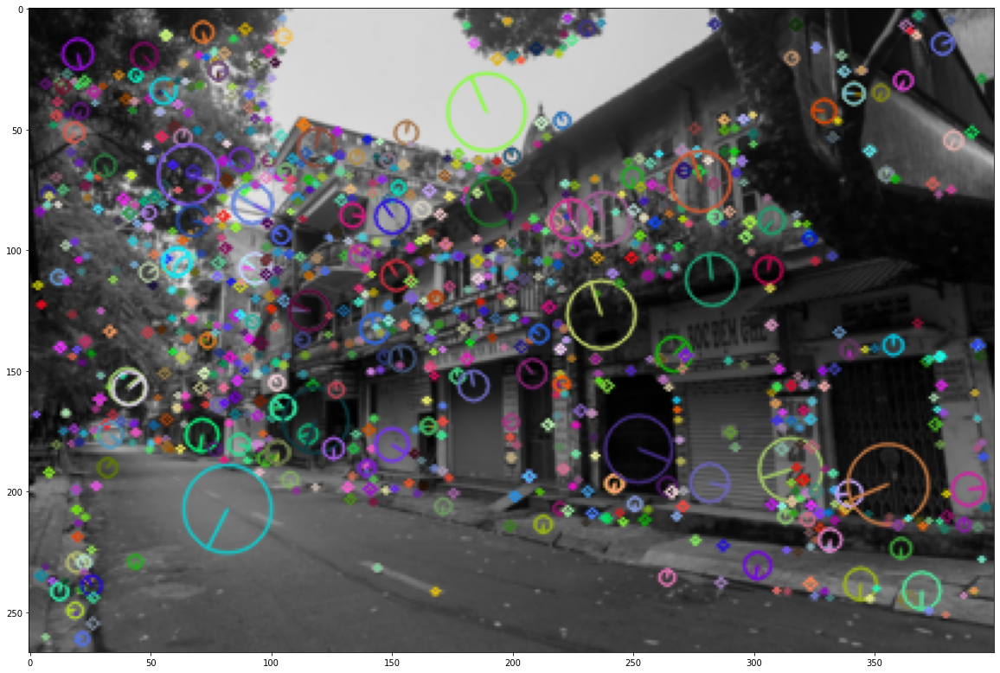

In [7]:
apply_SIFT_descriptor(imgDownScale)

<u>Sources:</u><br><br>
https://people.eecs.berkeley.edu/~malik/cs294/lowe-ijcv04.pdf <br><br>
https://towardsdatascience.com/sift-scale-invariant-feature-transform-c7233dc60f37 <br><br>
https://medium.com/data-breach/introduction-to-sift-scale-invariant-feature-transform-65d7f3a72d40 <br><br>
https://www.analyticsvidhya.com/blog/2019/10/detailed-guide-powerful-sift-technique-image-matching-python/ <br><br>